<a href="https://colab.research.google.com/github/abdellah-idris/SentimentAnalysis/blob/main/sentiment_analysis_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Analyse de l'actualité financière**

In [1]:
!pip install -q pandas numpy nltk scikit-learn datasets evaluate plotly
!pip install -q pyldavis
!pip install -q shap
!pip install -q bertopic
!pip install -q transformers -U
!pip install -q wordcloud

In [2]:
!pip install -q transformers[torch] accelerate -U

#### Import Statements

In [3]:
import os
import pandas as pd
import numpy as np
import nltk
import spacy
import re
import torch
from datasets import load_dataset
from transformers import AutoTokenizer, TrainingArguments, Trainer, AutoModelForSequenceClassification
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.tokenize import word_tokenize
import plotly.express as px
import plotly.figure_factory as ff
from wordcloud import WordCloud
import evaluate


from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import LatentDirichletAllocation

from nltk.tokenize import RegexpTokenizer

from sklearn.decomposition import NMF
import matplotlib.pyplot as plt
import gensim
from gensim.models import Phrases
from gensim.corpora.dictionary import Dictionary
from gensim.models.ldamodel import LdaModel
from gensim.models.coherencemodel import CoherenceModel
from gensim.models import Word2Vec

from sklearn.svm import LinearSVC

import shap
import scipy as sp

# Add imports specific to your project or use case here
from bertopic import BERTopic
from sklearn.datasets import fetch_20newsgroups
import seaborn as sns

from gensim.models.ldamodel import LdaModel
from gensim.models.coherencemodel import CoherenceModel

from sklearn.model_selection import StratifiedKFold, cross_val_score


In [4]:
import plotly.io as pio
pio.renderers.default = "colab"

## Data Collection: https://huggingface.co/datasets/financial_phrasebank

In [5]:
dataset = load_dataset('financial_phrasebank', 'sentences_allagree')

In [6]:
dataset

DatasetDict({
    train: Dataset({
        features: ['sentence', 'label'],
        num_rows: 2264
    })
})

In [7]:
tmp_df = dataset['train'].to_pandas()

In [8]:
tmp_df['label'].unique() #labels

array([1, 2, 0])

In [9]:
tmp_df.head() # data discovering

,sentence,label
0,"According to Gran , the company has no plans t...",1
1,"For the last quarter of 2010 , Componenta 's n...",2
2,"In the third quarter of 2010 , net sales incre...",2
3,Operating profit rose to EUR 13.1 mn from EUR ...,2
4,"Operating profit totalled EUR 21.1 mn , up fro...",2


## Exploratory Data Analysis (EDA)

**Distribution des données**

In [10]:
fig = px.pie(tmp_df, names='label', labels = 'label', title='Data Distribution')
fig.show()

In [11]:
# Create a countplot using Plotly Express
fig = px.histogram(tmp_df, x="label", title='Data Distribution', color="label")

# Customize the appearance of x-axis tick labels
fig.update_xaxes(
    tickmode='array',
    tickvals=[0, 1, 2],  # Specify the tick values for your labels
    ticktext=["Negative", "Neutre", "Positive"],  # Specify the labels for each tick value
    showticklabels=True,  # Show tick labels
)

# Show the plot
fig.show()

**Analyse**
l'ensemble de données est fortement déséquilibré, avec une majorité d'enregistrements avec des sentiments neutres, tandis que les sentiments positifs et négatifs ont un nombre inférieur d'enregistrements dans l'ensemble de données.



**Distribution de la longeur du texte**

In [12]:
tmp_df['length_text'] = tmp_df['sentence'].apply(lambda x: len(str(x)))

In [13]:
tmp_df.head()

,sentence,label,length_text
0,"According to Gran , the company has no plans t...",1,127
1,"For the last quarter of 2010 , Componenta 's n...",2,193
2,"In the third quarter of 2010 , net sales incre...",2,125
3,Operating profit rose to EUR 13.1 mn from EUR ...,2,122
4,"Operating profit totalled EUR 21.1 mn , up fro...",2,103


In [14]:
fig = px.histogram(tmp_df, x='length_text', template='plotly_white', title='Text counts by length')
fig.update_xaxes(categoryorder='total descending', title='Number of words')
fig.show()

In [15]:
fig = px.box(tmp_df, x = 'label', y = 'length_text')
fig

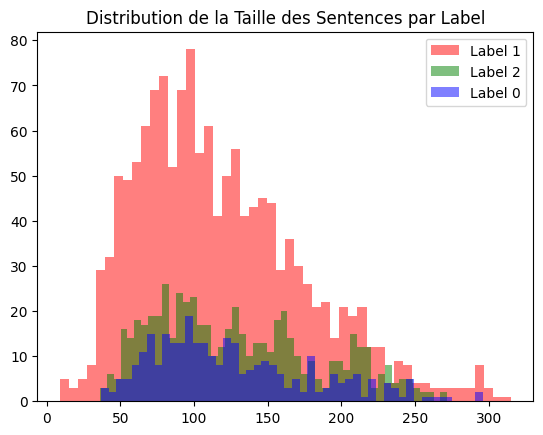

In [16]:
# Define colors for each label (you can use the same colors as above)
colors = ['red', 'green', 'blue']

# Create separate histograms for each label
for label, color in zip(tmp_df['label'].unique(), colors):
    subset = tmp_df[tmp_df['label'] == label]
    plt.hist(subset['length_text'], bins=50, alpha=0.5, label=f'Label {label}', color=color)

# Add a title
plt.title('Distribution de la Taille des Sentences par Label')

# Add legend
plt.legend()

# Show the plot
plt.show()

**Analyse**

Les représentation précedentes démontrent que la tailles des textes est généralement entre 80 et 160.
Il y a une décroissance progressive du nombre de textes à mesure que la longueur augmente.

## Pre-processing & Text Cleaning

In [17]:
# Assurez-vous que les données nltk sont téléchargées (stopwords et wordnet)
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')


# Initialiser le lemmatiseur
lemma = WordNetLemmatizer()

stop = set(stopwords.words('english'))

# Fonction de nettoyage du texte
def clean_text(text):
    # Conversion en minuscules
    text = text.lower()
    # Tokenisation
    words = nltk.word_tokenize(text)
    # Lemmatisation et suppression des stopwords
    words = [lemma.lemmatize(word) for word in words if word not in stop]
    # Joindre les mots pour former une chaîne
    text = " ".join(words)
    # Suppression des caractères non alphabétiques
    text = re.sub('[^a-z]', ' ', text)
    # Suppression des espaces multiples
    text = re.sub('( ){2,}', ' ', text)
    return text

# Appliquer la fonction de nettoyage sur la colonne 'sentence'
tmp_df['cleaned_text'] = tmp_df['sentence'].apply(clean_text)
tmp_df['length_cleaned_text'] = tmp_df['cleaned_text'].apply(lambda x: len(str(x)))


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [18]:
tmp_df.head() # compare cleaned text to original one

,sentence,label,length_text,cleaned_text,length_cleaned_text
0,"According to Gran , the company has no plans t...",1,127,according gran company plan move production ru...,76
1,"For the last quarter of 2010 , Componenta 's n...",2,193,last quarter componenta s net sale doubled eur...,120
2,"In the third quarter of 2010 , net sales incre...",2,125,third quarter net sale increased eur mn operat...,64
3,Operating profit rose to EUR 13.1 mn from EUR ...,2,122,operating profit rose eur mn eur mn correspond...,79
4,"Operating profit totalled EUR 21.1 mn , up fro...",2,103,operating profit totalled eur mn eur mn repres...,62


In [19]:
# comparing text length after cleaning
fig = px.histogram(tmp_df, x='length_cleaned_text', template='plotly_white', title='Text counts by length')
fig.update_xaxes(categoryorder='total descending', title='Number of words')
fig.show()

In [20]:
fig = px.box(tmp_df, x = 'label', y = 'length_cleaned_text')
fig

array([[<Axes: title={'center': '0'}>, <Axes: title={'center': '1'}>],
       [<Axes: title={'center': '2'}>, <Axes: >]], dtype=object)

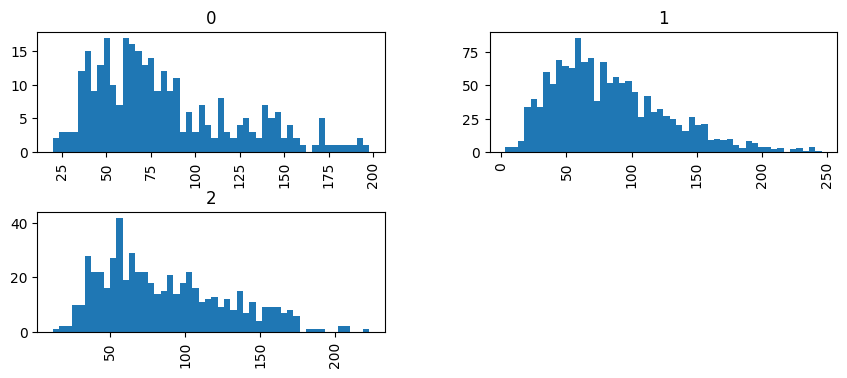

In [21]:
tmp_df.hist(column='length_cleaned_text', by='label', bins=50,figsize=(10,4))

**Vectorisation**



Comptage de mot

In [22]:
text = tmp_df['cleaned_text'] # tmp variable
model = CountVectorizer(ngram_range = (1, 1), stop_words='english')
matrix = model.fit_transform(text).toarray() # matrix of word counts
df_output = pd.DataFrame(data = matrix, columns = model.get_feature_names_out())
df_output.T.tail(5)

,0,1,2,3,4,5,6,7,8,9,...,2254,2255,2256,2257,2258,2259,2260,2261,2262,2263
zgody,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
zinc,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
zoltan,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
zone,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
zu,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [23]:
# Sum the counts of each word across all documents
word_counts = df_output.sum()

# Sort the words by their counts in descending order
most_used_words = word_counts.sort_values(ascending=False)

# Display the top N most used words (e.g., top 10)
N = 10
print(most_used_words.head(N))

eur        1017
mn          500
company     384
profit      325
net         292
sale        278
year        274
million     267
share       266
finnish     224
dtype: int64


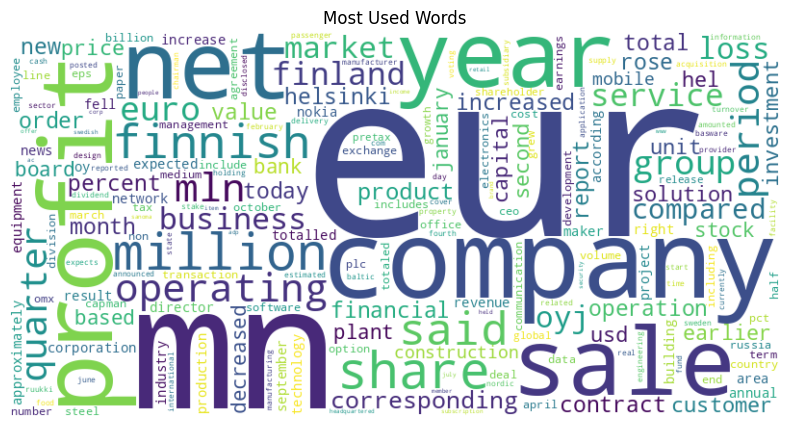

In [24]:
# Create a WordCloud object
wordcloud = WordCloud(width=800, height=400, background_color='white')

# Convert the most used words series to a dictionary
most_used_words_dict = most_used_words.to_dict()

# Generate the word cloud from the dictionary
wordcloud.generate_from_frequencies(most_used_words_dict)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title("Most Used Words")
plt.axis('off')
plt.show()

Extraction des N-grammes les Plus Fréquents

In [25]:
def get_ngrams(text, ngram_from=2, ngram_to=2, n=None, max_features=20000):

    vec = CountVectorizer(ngram_range = (ngram_from, ngram_to),
                          max_features = max_features,
                          stop_words='english').fit(text)

    bag_of_words = vec.transform(text)
    sum_words = bag_of_words.sum(axis = 0)
    words_freq = [(word, sum_words[0, i]) for word, i in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse = True)

    return words_freq[:n]

In [26]:
bigrams = get_ngrams(tmp_df['cleaned_text'], ngram_from=2, ngram_to=2, n=50)
bigrams_df = pd.DataFrame(bigrams)
bigrams_df.columns=["Bigram", "Frequency"]
bigrams_df.head()

,Bigram,Frequency
0,eur mn,479
1,net sale,147
2,operating profit,146
3,eur million,139
4,mn eur,132


In [27]:
px.bar(bigrams_df, x = 'Bigram', y = 'Frequency')

On remarque facilement que les bigrammes les plus fréquent continnent le mot eur, suggérant ainsi un contexte financier

# Train Sentiment Analysis ML Models using TF-IDF / BoW !

## Data representation

**Bow**

Bag Of Words. C’est-à-dire en couple mot/nombre d’occurrences, où la clé est représentée par le mot et la valeur par son nombre d’occurrences.

**Tokenisation** : Tout d'abord, le texte est divisé en mots individuels ou en tokens, et toute ponctuation ou caractère spécial est supprimé.

Vocabulaire : Ensuite, un vocabulaire est créé en collectant tous les mots uniques de l'ensemble du corpus (ensemble de documents).

**Vectorisation** : Chaque document est représenté comme un vecteur, où chaque dimension correspond à un mot unique du vocabulaire. La valeur dans chaque dimension représente le nombre ou la présence de ce mot dans le document. Le vecteur résultant est souvent appelé vecteur de "fréquence des termes".

**Matrice creuse** : Comme la plupart des documents ne contiennent qu'un petit sous-ensemble des mots du vocabulaire, la représentation BoW est généralement une matrice creuse avec de nombreuses valeurs nulles.

**Cas d'utilisation** : Le BoW est utilisé pour des tâches telles que la classification de documents, l'analyse de sentiment et la recherche d'informations. Il est simple et interprétable, mais ne capture pas la sémantique des mots ni leur context

In [28]:
vectorizer = CountVectorizer(max_features = 1000, min_df = 0.1, stop_words='english')

In [29]:
X = tmp_df['cleaned_text'].values
X = vectorizer.fit_transform(X) # bow representation
y = tmp_df['label'].values

X_train_bow, X_test_bow, y_train_bow, y_test_bow = train_test_split(X, y, test_size = 0.2, random_state = 42 )

In [30]:
vectorizer.get_feature_names_out()[:10]

array(['company', 'eur', 'mn', 'net', 'profit', 'sale', 'year'],
      dtype=object)

**BoW + N-grams**

In [31]:
vectorizer = CountVectorizer(max_features = 1000, min_df = 0.05, stop_words='english', ngram_range=(1,3))

X = tmp_df['cleaned_text'].values
X = vectorizer.fit_transform(X)
y = tmp_df['label'].values

X_train_bow_ngram, X_test_bow_ngram, y_train_bow_ngram, y_test_bow_ngram = train_test_split(X, y, test_size = 0.2, random_state = 42 )

**TF-IDF**

 vise à surmonter certaines limitations du BoW. Il attribue à chaque mot d'un document un poids en fonction de son importance dans ce document et dans l'ensemble du corpus.

 **Fréquence des termes (TF)** : Elle mesure à quelle fréquence un mot apparaît dans un document. Plus un mot apparaît fréquemment dans un document, plus son score TF est élevé.

**Fréquence inverse du document (IDF)** : Elle mesure à quel point un mot est unique ou rare dans l'ensemble des documents du corpus. Les mots communs à tous les documents reçoivent un score IDF plus faible.

**Score TF-IDF** : Le score TF-IDF d'un mot dans un document est calculé comme le produit de ses scores TF et IDF.

**Vectorisation** : Chaque document est représenté comme un vecteur de scores TF-IDF pour chaque mot du vocabulaire.

**Cas d'utilisation** : Le TF-IDF est utilisé pour la recherche d'informations, l'exploration de texte et le classement de documents. Il permet d'identifier les mots importants dans un document et distinctifs entre les documents.

In [32]:
vectorizer = TfidfVectorizer(max_features = 10000, stop_words='english')

X = tmp_df['cleaned_text'].values
X = vectorizer.fit_transform(X)
y = tmp_df['label'].values

X_train_tf_idf, X_test_tf_idf, y_train_tf_idf, y_test_tf_idf = train_test_split(X, y, test_size = 0.2, random_state = 42 )

**TF-IDF + N-grams**

In [33]:
vectorizer = TfidfVectorizer(max_features = 10000, stop_words='english', ngram_range=(1,4))

X = tmp_df['cleaned_text'].values
X = vectorizer.fit_transform(X)
y = tmp_df['label'].values

X_train_tf_idf_ngram, X_test_tf_idf_ngram, y_train_tf_idf_ngram, y_test_tf_idf_ngram = train_test_split(X, y, test_size = 0.2, random_state = 42 )

***Train Word2Vec for Sentiment Analysis***

Word2Vec est une technique d'encastrement de mots qui vise à capturer la sémantique et les relations entre les mots. Contrairement au BoW et au TF-IDF, qui représentent les mots comme des symboles discrets, Word2Vec représente les mots sous forme de vecteurs continus dans un espace multidimensionnel.

**Entraînement :** Word2Vec est entraîné sur un grand corpus de données textuelles. Il apprend à prédire le contexte (mots environnants) d'un mot cible dans une phrase. Deux modèles Word2Vec populaires sont Skip-gram et Continuous Bag of Words (CBOW).

**Représentation vectorielle :** Après l'entraînement, chaque mot du vocabulaire est représenté sous forme de vecteur dense dans un espace continu. Les mots ayant des significations similaires sont proches les uns des autres dans l'espace vectoriel.

**Relations sémantiques :** Word2Vec capture les relations sémantiques entre les mots. Par exemple, des mots comme "roi" et "reine" sont censés avoir des représentations vectorielles similaires car ils apparaissent souvent dans des contextes similaires.

**Cas d'utilisation :** Word2Vec est utilisé pour des tâches telles que la similarité entre mots, le regroupement de documents et l'analyse de sentiment. Il est utile pour capturer des informations sémantiques et contextuelles dans les tâches de NLP


In [34]:
texts = [i.split() for i in tmp_df['cleaned_text']]
model_word2vec = Word2Vec(sentences=texts, vector_size=300, window=10, min_count=2, workers=4)

In [35]:
print(len(model_word2vec.wv))

2317


In [36]:
def document_vector(doc):
    word_vectors = [model_word2vec.wv[word] for word in doc if word in model_word2vec.wv]
    return np.mean(word_vectors, axis=0) if word_vectors else np.zeros(model_word2vec.vector_size)

tmp_df['word2vec_avg'] = tmp_df['cleaned_text'].apply(lambda x: document_vector(x.split()))

X_train_word2vec, X_test_word2vec, y_train_word2vec, y_test_word2vec = train_test_split(tmp_df['word2vec_avg'].tolist(), tmp_df['label'], test_size=0.2, random_state=42)

X_train_word2vec = np.vstack(X_train_word2vec)
X_test_word2vec = np.vstack(X_test_word2vec)

***Models***

Bow

In [37]:
# Multinomial Naive bayes bag of words model
mnb_bow = MultinomialNB()
mnb_bow.fit(X_train_bow, y_train_bow)

# SVM bag of words model
svm_bow = SVC(probability=True,kernel='linear')
svm_bow.fit(X_train_bow, y_train_bow)

# LogisticRegression
logistic_regression_bow = LogisticRegression()
logistic_regression_bow.fit(X_train_bow, y_train_bow)


LogisticRegression()

Bow + N-gram

In [38]:
mnb_bow_ngram = MultinomialNB()
mnb_bow_ngram.fit(X_train_bow_ngram, y_train_bow)

svm_bow_ngram = SVC(probability=True, kernel='linear')
svm_bow_ngram.fit(X_train_bow_ngram, y_train_bow)

logistic_regression_bow_ngram = LogisticRegression()
logistic_regression_bow_ngram.fit(X_train_bow_ngram, y_train_bow)


LogisticRegression()

TF-IDF

In [39]:
# Multinomial Naive bayes bag of words model
mnb_tf_idf = MultinomialNB()
mnb_tf_idf.fit(X_train_tf_idf, y_train_tf_idf)

# SVM bag of words model
svm_tf_idf =SVC(probability=True,kernel='linear')
svm_tf_idf.fit(X_train_tf_idf, y_train_tf_idf)

# LogisticRegression
logistic_regression_tf_idf = LogisticRegression()
logistic_regression_tf_idf.fit(X_train_tf_idf, y_train_tf_idf)


LogisticRegression()

TF-IDF + N-Gram

In [40]:
# Multinomial Naive bayes bag of words model
mnb_tf_idf_ngram = MultinomialNB()
mnb_tf_idf_ngram.fit(X_train_tf_idf_ngram, y_train_tf_idf_ngram)

# SVM bag of words model
svm_tf_idf_ngram =SVC(probability=True,kernel='linear')
svm_tf_idf_ngram.fit(X_train_tf_idf_ngram, y_train_tf_idf_ngram)

# LogisticRegression
logistic_regression_tf_idf_ngram = LogisticRegression()
logistic_regression_tf_idf_ngram.fit(X_train_tf_idf_ngram, y_train_tf_idf_ngram)


LogisticRegression()

**Word2vec**

In [41]:
# SVM bag of words model
svm_word2vec =SVC(probability=True,kernel='linear')
svm_word2vec.fit(X_train_word2vec, y_train_word2vec)

# LogisticRegression
logistic_regression_word2vec = LogisticRegression()
logistic_regression_word2vec.fit(X_train_word2vec, y_train_word2vec)


LogisticRegression()

Cross Validation

In [42]:


# Define your classifiers (e.g., LogisticRegression, SVC, MultinomialNB)
classifiers = [LogisticRegression(max_iter=1000), SVC(probability=True, kernel='linear'), MultinomialNB()]

# Define your data representations (e.g., X_train_bow, X_train_bow_ngram, X_train_tf_idf, X_train_tf_idf_ngram, X_train_word2vec)
data_representations = {
    'BoW': (X_train_bow, y_train_bow, X_test_bow, y_test_bow),
    'BoW with n-grams': (X_train_bow_ngram, y_train_bow_ngram, X_test_bow_ngram, y_test_bow_ngram),
    'TF-IDF': (X_train_tf_idf, y_train_tf_idf, X_test_tf_idf, y_test_tf_idf),
    'TF-IDF with n-grams': (X_train_tf_idf_ngram, y_train_tf_idf_ngram, X_test_tf_idf_ngram,y_test_tf_idf_ngram)
}

# Create a dictionary to store the results
results_dict = {
    'Data Representation': [],
    'Model': [],
    'Accuracy Mean': [],
    'Classification Report': []  # Add a new column for classification reports

}

In [43]:
# Perform cross-validation and store the results in the results_dict
for representation_name, (X_train_data, y_train_data, X_test, y_test) in data_representations.items():
    print(representation_name)
    for classifier in classifiers:
        cv_scores = cross_val_score(classifier, X_train_data, y_train_data, cv=StratifiedKFold(n_splits=5), scoring='accuracy')
        accuracy_mean = cv_scores.mean()
        accuracy_std = cv_scores.std()
        model_name = classifier.__class__.__name__

        # Fit the classifier on the data for classification report
        classifier.fit(X_train_data, y_train_data)
        y_pred = classifier.predict(X_test)  # Assuming you have a separate test dataset X_test

        # Calculate the classification report
        report = classification_report(y_test, y_pred, target_names=['negative', 'neutral', 'positive'], output_dict=True)

        results_dict['Data Representation'].append(representation_name)
        results_dict['Model'].append(model_name)
        results_dict['Accuracy Mean'].append(accuracy_mean)
        results_dict['Classification Report'].append(report)



print(results_dict)
# Create a DataFrame from the results_dict
results_df = pd.DataFrame(results_dict)

BoW
BoW with n-grams
TF-IDF
TF-IDF with n-grams
{'Data Representation': ['BoW', 'BoW', 'BoW', 'BoW with n-grams', 'BoW with n-grams', 'BoW with n-grams', 'TF-IDF', 'TF-IDF', 'TF-IDF', 'TF-IDF with n-grams', 'TF-IDF with n-grams', 'TF-IDF with n-grams'], 'Model': ['LogisticRegression', 'SVC', 'MultinomialNB', 'LogisticRegression', 'SVC', 'MultinomialNB', 'LogisticRegression', 'SVC', 'MultinomialNB', 'LogisticRegression', 'SVC', 'MultinomialNB'], 'Accuracy Mean': [0.7239121501301311, 0.7167343956896944, 0.6918846932407957, 0.7228102217554754, 0.7178408900659027, 0.6990624476812323, 0.8028689709754501, 0.8315769447361612, 0.7669862867753374, 0.7896245224723376, 0.8293852639909897, 0.7774683043392235], 'Classification Report': [{'negative': {'precision': 0.3548387096774194, 'recall': 0.19642857142857142, 'f1-score': 0.25287356321839083, 'support': 56}, 'neutral': {'precision': 0.8006134969325154, 'recall': 0.9456521739130435, 'f1-score': 0.867109634551495, 'support': 276}, 'positive': {'pr

In [44]:
# Print the classification report for each model
def classification_report_to_df(report):
    report_df = pd.DataFrame(report).transpose()
    report_df['support'] = report_df['support'].astype(int)
    return report_df

for i, row in results_df.iterrows():
    print(f"Classification Report for {row['Model']} with {row['Data Representation']}:\n")
    print(classification_report_to_df(row['Classification Report']))
    print("\n")

Classification Report for LogisticRegression with BoW:

              precision    recall  f1-score  support
negative       0.354839  0.196429  0.252874       56
neutral        0.800613  0.945652  0.867110      276
positive       0.583333  0.462810  0.516129      121
accuracy       0.724062  0.724062  0.724062        0
macro avg      0.579595  0.534964  0.545371      453
weighted avg   0.687469  0.724062  0.697428      453


Classification Report for SVC with BoW:

              precision    recall  f1-score  support
negative       0.200000  0.017857  0.032787       56
neutral        0.800000  0.942029  0.865225      276
positive       0.577236  0.586777  0.581967      121
accuracy       0.732892  0.732892  0.732892        0
macro avg      0.525745  0.515554  0.493326      453
weighted avg   0.666326  0.732892  0.686658      453


Classification Report for MultinomialNB with BoW:

              precision    recall  f1-score  support
negative       0.363636  0.214286  0.269663       56


In [45]:
# Pivot the DataFrame
pivot_df = results_df.pivot(index='Data Representation', columns='Model', values='Accuracy Mean')

# Sort columns by Model name
pivot_df = pivot_df.reindex(sorted(pivot_df.columns), axis=1)

# Print the pivot table
print(pivot_df)


Model                LogisticRegression  MultinomialNB       SVC
Data Representation                                             
BoW                            0.723912       0.691885  0.716734
BoW with n-grams               0.722810       0.699062  0.717841
TF-IDF                         0.802869       0.766986  0.831577
TF-IDF with n-grams            0.789625       0.777468  0.829385


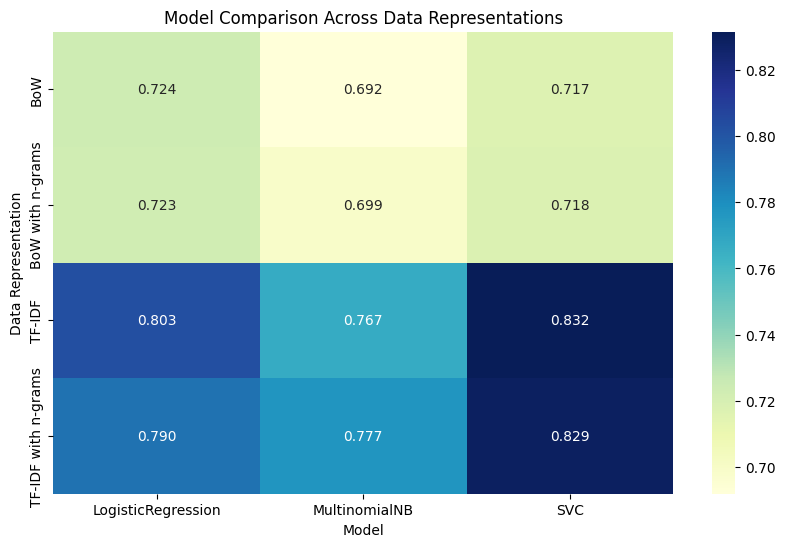

In [46]:

# Pivot the results_df DataFrame to have Data Representation as rows and Model as columns
heatmap_data = results_df.pivot(index='Data Representation', columns='Model', values='Accuracy Mean')

# Create a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, annot=True, cmap='YlGnBu', fmt='.3f')
plt.title('Model Comparison Across Data Representations')
plt.xlabel('Model')
plt.ylabel('Data Representation')
plt.show()


L'observation clé est que le modèle Support Vector Classifier (SVC) avec TF-IDF donne les meilleures performances, tandis que le Multinomial Naive Bayes (MultinomialNB) est généralement moins performant que les autres modèles.

**TF-IDF** :  

*   attribue des poid aux mots captureant snt importance dans chaque document
*   Suppression des Mots Courants


**BoW**

 - crée une matrice de grande dimension avec un grand nombre de colonnes, ce qui peut entraîner des problèmes de dimensionnalité.

#### word2vec cross validation

In [47]:
# Define your classifiers
classifiers = [
    ('Logistic Regression', LogisticRegression(max_iter=1000)),
    ('SVM', SVC(kernel='linear'))
    # Add more classifiers as needed
]

# Perform cross-validation for each classifier
for classifier_name, classifier in classifiers:
    cv_scores = cross_val_score(classifier, X_train_word2vec, y_train_word2vec, cv=StratifiedKFold(n_splits=5), scoring='accuracy')
    accuracy_mean = cv_scores.mean()
    accuracy_std = cv_scores.std()

    print(f"Cross-Validation Results ({classifier_name} - Word2Vec):")
    print("Accuracy Mean:", accuracy_mean)
    print()


Cross-Validation Results (Logistic Regression - Word2Vec):
Accuracy Mean: 0.6460572576594676

Cross-Validation Results (SVM - Word2Vec):
Accuracy Mean: 0.6416373681567051



Word2vec capture la sémantique du mot. Il est probable que les modéles avec word2vec performe mieux.

Dans notre cas avec un petit dataset et l'ordre des mots nous importe peu,TF-IDF et BOW offre de meilleurs résultats.


# Fine-tune LMs for Sentiment Analysis (BERT, RoBERTa, AlBERT, DistilBERT....)


In [48]:
## Fine-tune LMs for Sentiment Analysis (BERT, RoBERTa, AlBERT, DistilBERT....)

In [49]:
dataset = load_dataset("financial_phrasebank", "sentences_allagree") # load data

In [50]:
dataset["train"][10] # before cleaning

{'sentence': 'Its board of directors will propose a dividend of EUR0 .12 per share for 2010 , up from the EUR0 .08 per share paid in 2009 .',
 'label': 2}

In [51]:
# Clean the text in the training dataset
cleaned_train_dataset = dataset['train'].map(lambda example: {'sentence': clean_text(example['sentence'])})

# Replace the 'train' split in your dataset with the cleaned version
dataset['train'] = cleaned_train_dataset
dataset["train"][10] # cleaned

{'sentence': 'board director propose dividend eur per share eur per share paid ',
 'label': 2}

In [52]:
# tokenize_function
def tokenize_function(examples, tokenizer):
    """
    Tokenize the text in the "sentence" key of the examples using the provided tokenizer.

    Args:
        examples (dict): A dictionary containing the text to tokenize.
        tokenizer (PreTrainedTokenizer): The tokenizer to use for tokenization.

    Returns:
        dict: A dictionary with the tokenized input and relevant padding and truncation.
    """
    return tokenizer(examples["sentence"], padding="max_length", truncation=True)


In [53]:
metric = evaluate.load("accuracy")

In [54]:
# The purpose of this function is to compute the metric value based on model predictions and true labels.

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)
    return metric.compute(predictions=predictions, references=labels)

***Trainers***


```
 function that takes the desired model; Train and return evaluation

```




In [55]:
# Define a function to train and evaluate a model
def train_and_evaluate(model_name):
    print(f"Training and evaluation {model_name}")

    # Initialize the tokenizer
    tokenizer = AutoTokenizer.from_pretrained(model_name)

    # Tokenize the dataset
    tokenized_datasets = dataset.map(lambda examples: tokenize_function(examples, tokenizer), batched=True)

    # Tokenize a smaller subset of your dataset
    small_train_dataset = tokenized_datasets["train"].select(range(1812))  # Adjust the range as needed
    small_eval_dataset = tokenized_datasets["train"].select(range(1812,2264))  # Adjust the range as needed

    # Initialize the model
    model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=3)

    # Training arguments
    training_args = TrainingArguments(
        output_dir=f"{model_name}_test_trainer",  # Change the output directory as needed
        evaluation_strategy="steps",
        num_train_epochs=5,  # Reduce training epochs
        eval_steps=100,  # Evaluate every 100 steps
        save_total_limit=1,  # Limit saved checkpoints
        load_best_model_at_end=True,  # Enable early stopping
        learning_rate=2e-5,  # Learning rate
    )

    # Initialize the trainer
    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=small_train_dataset,
        eval_dataset=small_eval_dataset,
        compute_metrics=compute_metrics,
    )

    # Train the model
    trainer.train()

    # Evaluate the model
    eval_results = trainer.evaluate()

    # Calculate predictions on the evaluation dataset
    eval_dataset = tokenized_datasets["train"].select(range(1812, 2264))  # Evaluation dataset
    eval_predictions = trainer.predict(eval_dataset)

    # Get the predicted labels and true labels
    predicted_labels = np.argmax(eval_predictions.predictions, axis=1)
    true_labels = eval_dataset["label"]

    # Calculate classification report
    report = classification_report(true_labels, predicted_labels, target_names=['negative', 'neutral', 'positive'], output_dict=True)

    print(f"Final evaluation {eval_results}")
    print(f"Classification Report:\n{report}")

    return eval_results, report, trainer

In [56]:
# Define a list of model names
model_names = ["albert-base-v2", "roberta-base", "distilbert-base-cased","bert-base-uncased", ]

# Create a dictionary to store evaluation results
results_dict = {}

report_dict = {}

fine_tuned_models = {} # retrieve from above function

# Iterate over the model names and train/evaluate each model
for model_name in model_names:
    eval_results, report, trainer = train_and_evaluate(model_name)  # Your method that returns a trainer
    results_dict[model_name] = eval_results
    report_dict[model_name] = report
    fine_tuned_models[model_name] = trainer

Training and evaluation albert-base-v2


Some weights of AlbertForSequenceClassification were not initialized from the model checkpoint at albert-base-v2 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Step,Training Loss,Validation Loss,Accuracy
100,No log,1.818560,0.358407
200,No log,2.623155,0.356195
300,No log,2.469417,0.369469
400,No log,3.581414,0.373894
500,0.428600,3.359287,0.376106
600,0.428600,3.593699,0.376106
700,0.428600,3.380984,0.380531
800,0.428600,3.749021,0.376106
900,0.428600,3.789777,0.382743
1000,0.215100,3.859239,0.373894


Final evaluation {'eval_loss': 3.3592870235443115, 'eval_accuracy': 0.37610619469026546, 'eval_runtime': 15.7907, 'eval_samples_per_second': 28.625, 'eval_steps_per_second': 3.61, 'epoch': 5.0}
Classification Report:
{'negative': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 269}, 'neutral': {'precision': 0.7487437185929648, 'recall': 0.9612903225806452, 'f1-score': 0.8418079096045197, 'support': 155}, 'positive': {'precision': 0.08300395256916997, 'recall': 0.75, 'f1-score': 0.14946619217081852, 'support': 28}, 'accuracy': 0.37610619469026546, 'macro avg': {'precision': 0.2772492237207116, 'recall': 0.5704301075268817, 'f1-score': 0.33042470059177936, 'support': 452}, 'weighted avg': {'precision': 0.2619012987916954, 'recall': 0.37610619469026546, 'f1-score': 0.297932034003282, 'support': 452}}
Training and evaluation roberta-base


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Step,Training Loss,Validation Loss,Accuracy
100,No log,2.314309,0.371681
200,No log,1.865488,0.367257
300,No log,2.662765,0.378319
400,No log,2.925126,0.380531
500,0.318400,1.790455,0.382743
600,0.318400,2.218798,0.491150
700,0.318400,1.598599,0.750000
800,0.318400,1.760976,0.727876
900,0.318400,1.940198,0.703540
1000,0.095400,1.929185,0.712389


Checkpoint destination directory roberta-base_test_trainer/checkpoint-500 already exists and is non-empty.Saving will proceed but saved results may be invalid.


Final evaluation {'eval_loss': 1.7904549837112427, 'eval_accuracy': 0.3827433628318584, 'eval_runtime': 12.7757, 'eval_samples_per_second': 35.38, 'eval_steps_per_second': 4.462, 'epoch': 5.0}
Classification Report:
{'negative': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 269}, 'neutral': {'precision': 0.8465909090909091, 'recall': 0.9612903225806452, 'f1-score': 0.9003021148036254, 'support': 155}, 'positive': {'precision': 0.08695652173913043, 'recall': 0.8571428571428571, 'f1-score': 0.15789473684210523, 'support': 28}, 'accuracy': 0.3827433628318584, 'macro avg': {'precision': 0.3111824769433465, 'recall': 0.6061443932411674, 'f1-score': 0.35273228388191025, 'support': 452}, 'weighted avg': {'precision': 0.29569994141103223, 'recall': 0.3827433628318584, 'f1-score': 0.31851300979234715, 'support': 452}}
Training and evaluation distilbert-base-cased


Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-cased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Step,Training Loss,Validation Loss,Accuracy
100,No log,2.103434,0.365044
200,No log,2.505695,0.365044
300,No log,2.254615,0.367257
400,No log,3.046190,0.373894
500,0.306100,2.686090,0.378319
600,0.306100,3.148751,0.382743
700,0.306100,2.032235,0.380531
800,0.306100,2.262389,0.462389
900,0.306100,2.045770,0.608407
1000,0.083000,2.016483,0.630531


Final evaluation {'eval_loss': 2.0164828300476074, 'eval_accuracy': 0.6305309734513275, 'eval_runtime': 7.0149, 'eval_samples_per_second': 64.435, 'eval_steps_per_second': 8.126, 'epoch': 5.0}
Classification Report:
{'negative': {'precision': 1.0, 'recall': 0.4200743494423792, 'f1-score': 0.5916230366492147, 'support': 269}, 'neutral': {'precision': 0.8352272727272727, 'recall': 0.9483870967741935, 'f1-score': 0.8882175226586102, 'support': 155}, 'positive': {'precision': 0.15337423312883436, 'recall': 0.8928571428571429, 'f1-score': 0.26178010471204194, 'support': 28}, 'accuracy': 0.6305309734513275, 'macro avg': {'precision': 0.6628671686187023, 'recall': 0.7537728630245719, 'f1-score': 0.5805402213399556, 'support': 452}, 'weighted avg': {'precision': 0.8910502340715367, 'recall': 0.6305309734513275, 'f1-score': 0.6728985747846471, 'support': 452}}
Training and evaluation bert-base-uncased


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Step,Training Loss,Validation Loss,Accuracy
100,No log,2.255801,0.360619
200,No log,1.816786,0.347345
300,No log,2.782956,0.373894
400,No log,2.730234,0.380531
500,0.300000,2.097356,0.402655
600,0.300000,2.621361,0.389381
700,0.300000,1.617982,0.707965
800,0.300000,1.534162,0.727876
900,0.300000,1.685022,0.714602
1000,0.059700,1.849175,0.696903


Final evaluation {'eval_loss': 1.8491748571395874, 'eval_accuracy': 0.6969026548672567, 'eval_runtime': 13.8475, 'eval_samples_per_second': 32.641, 'eval_steps_per_second': 4.116, 'epoch': 5.0}
Classification Report:
{'negative': {'precision': 0.9862068965517241, 'recall': 0.5315985130111525, 'f1-score': 0.6908212560386474, 'support': 269}, 'neutral': {'precision': 0.8705882352941177, 'recall': 0.9548387096774194, 'f1-score': 0.9107692307692308, 'support': 155}, 'positive': {'precision': 0.17518248175182483, 'recall': 0.8571428571428571, 'f1-score': 0.29090909090909095, 'support': 28}, 'accuracy': 0.6969026548672567, 'macro avg': {'precision': 0.6773258711992222, 'recall': 0.7811933599438096, 'f1-score': 0.6308331925723231, 'support': 452}, 'weighted avg': {'precision': 0.896318453831976, 'recall': 0.6969026548672567, 'f1-score': 0.7414725734271714, 'support': 452}}


In [57]:
# Compare the results
for model_name, eval_results in results_dict.items():
    print(f"{model_name} Results:", eval_results)

albert-base-v2 Results: {'eval_loss': 3.3592870235443115, 'eval_accuracy': 0.37610619469026546, 'eval_runtime': 15.7907, 'eval_samples_per_second': 28.625, 'eval_steps_per_second': 3.61, 'epoch': 5.0}
roberta-base Results: {'eval_loss': 1.7904549837112427, 'eval_accuracy': 0.3827433628318584, 'eval_runtime': 12.7757, 'eval_samples_per_second': 35.38, 'eval_steps_per_second': 4.462, 'epoch': 5.0}
distilbert-base-cased Results: {'eval_loss': 2.0164828300476074, 'eval_accuracy': 0.6305309734513275, 'eval_runtime': 7.0149, 'eval_samples_per_second': 64.435, 'eval_steps_per_second': 8.126, 'epoch': 5.0}
bert-base-uncased Results: {'eval_loss': 1.8491748571395874, 'eval_accuracy': 0.6969026548672567, 'eval_runtime': 13.8475, 'eval_samples_per_second': 32.641, 'eval_steps_per_second': 4.116, 'epoch': 5.0}


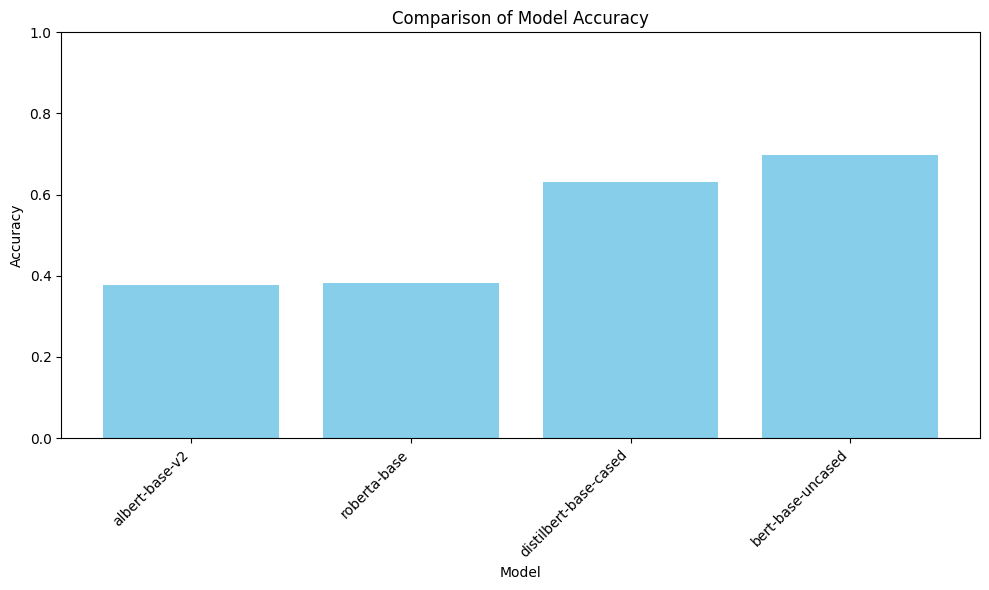

In [58]:
import matplotlib.pyplot as plt

# Extract the model names and accuracy values from the results_dict
model_names = list(results_dict.keys())
accuracy_values = [result['eval_accuracy'] for result in results_dict.values()]

# Create a bar chart to compare the accuracy values
plt.figure(figsize=(10, 6))
plt.bar(model_names, accuracy_values, color='skyblue')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Comparison of Model Accuracy')
plt.ylim(0, 1)
plt.xticks(rotation=45, ha="right")
plt.tight_layout()

# Show the bar chart
plt.show()

In [59]:
# report results
for model_name, report_result in report_dict.items():
    print(f"{model_name} Results:", report_result)

albert-base-v2 Results: {'negative': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 269}, 'neutral': {'precision': 0.7487437185929648, 'recall': 0.9612903225806452, 'f1-score': 0.8418079096045197, 'support': 155}, 'positive': {'precision': 0.08300395256916997, 'recall': 0.75, 'f1-score': 0.14946619217081852, 'support': 28}, 'accuracy': 0.37610619469026546, 'macro avg': {'precision': 0.2772492237207116, 'recall': 0.5704301075268817, 'f1-score': 0.33042470059177936, 'support': 452}, 'weighted avg': {'precision': 0.2619012987916954, 'recall': 0.37610619469026546, 'f1-score': 0.297932034003282, 'support': 452}}
roberta-base Results: {'negative': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 269}, 'neutral': {'precision': 0.8465909090909091, 'recall': 0.9612903225806452, 'f1-score': 0.9003021148036254, 'support': 155}, 'positive': {'precision': 0.08695652173913043, 'recall': 0.8571428571428571, 'f1-score': 0.15789473684210523, 'support': 28}, 'accuracy': 0.382

Les modéles utilisés montrent une simulitude  des réultat, On peut noté que albert, robert et distill-bert sont des amélioration du modéle Bert.

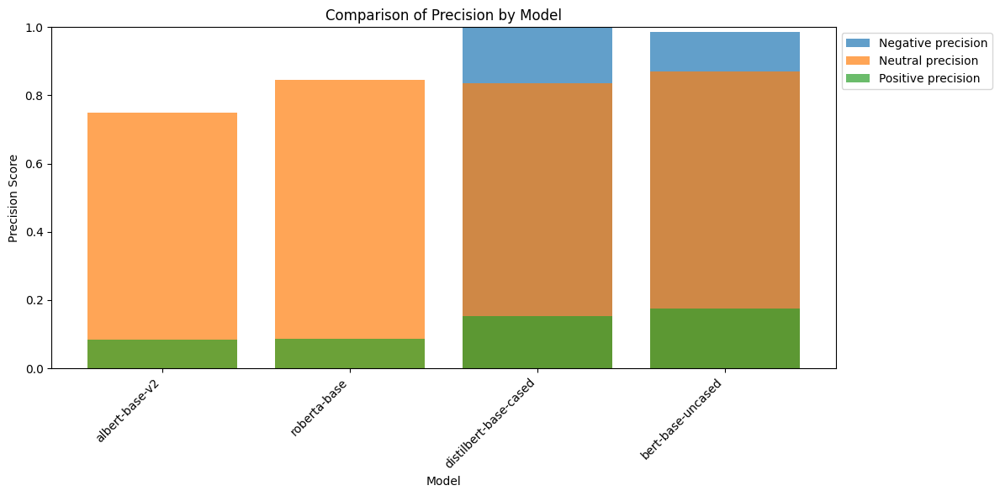

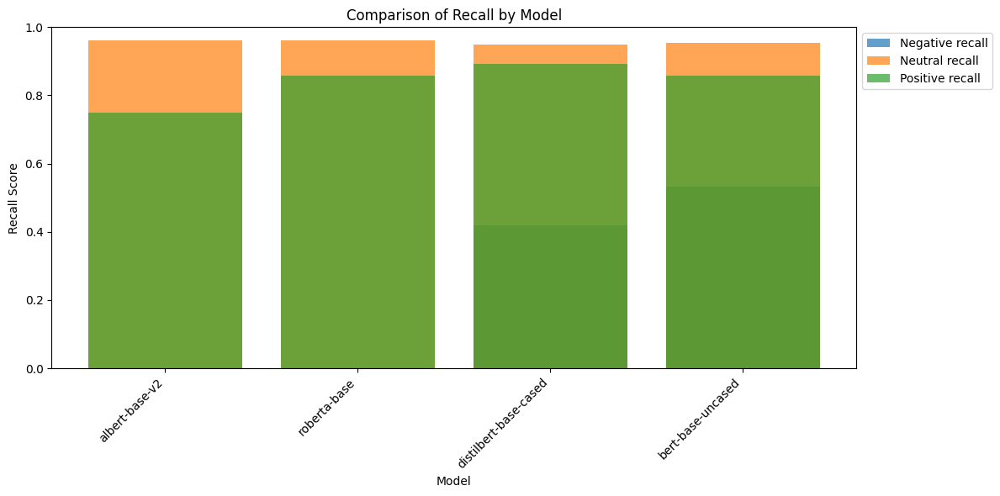

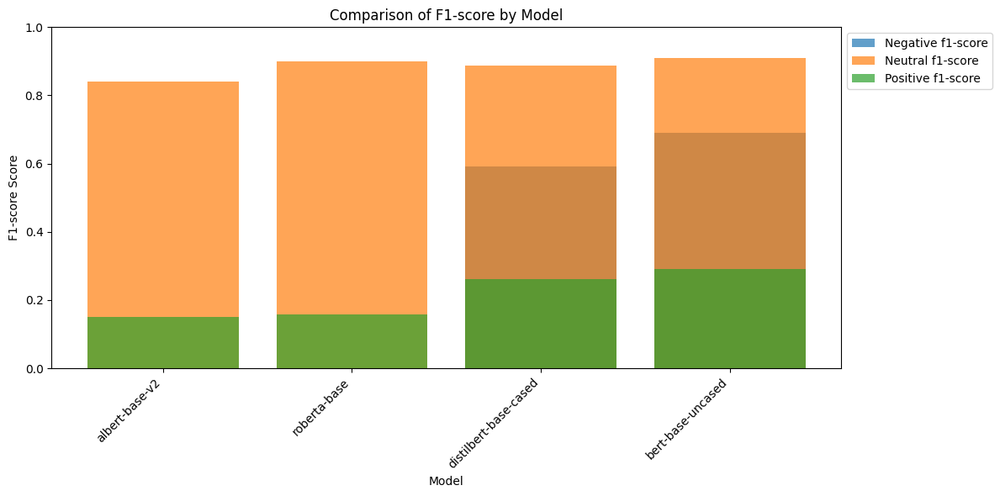

In [60]:
import matplotlib.pyplot as plt

# Define model names and sentiment classes
model_names = list(report_dict.keys())
sentiment_classes = ['negative', 'neutral', 'positive']

# Create separate bar charts for precision, recall, and F1-score
for metric in ['precision', 'recall', 'f1-score']:
    plt.figure(figsize=(12, 6))

    for sentiment in sentiment_classes:
        metric_values = [report_dict[model_name][sentiment][metric] for model_name in model_names]
        plt.bar(model_names, metric_values, label=f'{sentiment.capitalize()} {metric}', alpha=0.7)

    plt.xlabel('Model')
    plt.ylabel(f'{metric.capitalize()} Score')
    plt.title(f'Comparison of {metric.capitalize()} by Model')
    plt.ylim(0, 1)
    plt.xticks(rotation=45, ha='right')
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
    plt.tight_layout()

    plt.show()


**Importance de la neutralité :**

- La classe de sentiment "neutre" est généralement bien classée par tous les modèles avec des précisions et rappels élevés.
- Cela suggère que les modèles sont efficaces pour identifier des textes neutres.

**Difficulté avec les sentiments extrêmes :**

- Les sentiments "négatif" et "positif" sont plus difficiles à classifier, et les performances varient considérablement d'un modèle à l'autre.
- Certains modèles ont une précision élevée pour un sentiment mais un rappel faible, ce qui signifie qu'ils sont bons pour prédire ce sentiment lorsqu'il est présent, mais ils peuvent manquer de nombreux exemples de ce sentiment.

**Conclusion**

Cela est du au fait que nos données sont déséquilibré, on a beaucoup plus de sentences **"neutre"** que de sentences **"négatif"** ou **"positif"**

***Pipeline*** : sentence prediction

In [61]:

def predict_sentence_label(sentence, model_name):
    if model_name not in fine_tuned_models:
        print(f"Fine-tuned model for {model_name} not found.")
        return None

    model = fine_tuned_models[model_name].model

    # Initialize the tokenizer
    tokenizer = AutoTokenizer.from_pretrained(model_name)

    # Tokenize the sentence
    tokens = tokenizer(sentence, padding="max_length", truncation=True, return_tensors="pt")

    # Ensure that tokens and the model are on the same device
    device = model.device
    tokens = {key: value.to(device) for key, value in tokens.items()}

    # Predict the label
    logits = model(**tokens).logits
    probabilities = torch.softmax(logits, dim=1)
    predicted_label = torch.argmax(probabilities, dim=1).item()
    print(f"model : {model_name}; Predicted Label: {predicted_label}")
    return predicted_label


In [62]:
# Test the function positive
for model_name in model_names :
  test_sentence = "Operating profit rose to EUR 13.1 mn from EUR 8.7 mn in the corresponding period in 2007 representing 7.7 % of net sales."
  predicted_label = predict_sentence_label(test_sentence, model_name)

model : albert-base-v2; Predicted Label: 2
model : roberta-base; Predicted Label: 2
model : distilbert-base-cased; Predicted Label: 2
model : bert-base-uncased; Predicted Label: 2


In [63]:
# Test the function neutral
for model_name in model_names :
  predicted_label = predict_sentence_label("Bids or offers include at least 1,000 shares and the value of the shares must correspond to at least EUR 4,000.", model_name)

model : albert-base-v2; Predicted Label: 1
model : roberta-base; Predicted Label: 1
model : distilbert-base-cased; Predicted Label: 1
model : bert-base-uncased; Predicted Label: 1


In [64]:
# Test the function negative
for model_name in model_names :
  predicted_label = predict_sentence_label("Raute reported a loss per share of EUR 0.86 for the first half of 2009 , against EPS of EUR 0.74 in the corresponding period of 2008.", model_name)

model : albert-base-v2; Predicted Label: 2
model : roberta-base; Predicted Label: 2
model : distilbert-base-cased; Predicted Label: 2
model : bert-base-uncased; Predicted Label: 0


**SHAP**

In [65]:
def compute_shap_values(model_name, data, num_samples=3, device="cuda"):
    # Initialize the tokenizer for the specific model
    tokenizer = AutoTokenizer.from_pretrained(model_name)

    # Define the function to be explained
    def f(x):
      tv = torch.tensor(
          [
              tokenizer.encode(v, padding="max_length", max_length=128, truncation=True)
              for v in x
          ]
      ).cuda()
      attention_mask = (tv != 0).type(torch.int64).cuda()
      outputs = model(tv, attention_mask=attention_mask)[0].detach().cpu().numpy()
      scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T
      val = sp.special.logit(scores)
      return val

    # Load the specific pre-trained model
    model = fine_tuned_models[model_name].model

    # Define the labels
    labels = sorted(model.config.label2id, key=model.config.label2id.get)

    # Create the SHAP explainer
    explainer = shap.Explainer(f, tokenizer, output_names=labels)

    # Compute SHAP values for a sample of data
    shap_values = explainer(data['train']['sentence'][:num_samples])


    # Predict labels for the samples
    predictions = []
    for i in range(num_samples):
        # Tokenize the sentence
        tokens = tokenizer(data['train']['sentence'][i], padding="max_length", max_length=128, truncation=True, return_tensors="pt").to(device)

        # Get model logits
        logits = model(**tokens).logits

        # Apply softmax to get class probabilities
        probabilities = torch.softmax(logits, dim=1)

        # Get the predicted label (class with highest probability)
        predicted_label = torch.argmax(probabilities, dim=1).item()

        # Append the predicted label to the list of predictions
        predictions.append(predicted_label)


    # plot shap
    shap.plots.text(shap_values)

    return shap_values, predictions


In [66]:
def compare_predictions_with_labels(model_name, dataset, num_samples=3):
    print(f"Comparing predictions and labels for model: {model_name}")
    shap_values, predictions = compute_shap_values(model_name, dataset, num_samples)
    real_labels = dataset['train']['label'][:num_samples]  # Replace with actual real labels
    sentence_texts = dataset['train']['sentence'][:num_samples]  # Replace with actual sentence texts

    for i in range(num_samples):
        print(f"Sample {i + 1}:")
        print(f"Sentence: {sentence_texts[i]}")
        print(f"Predicted Label: {predictions[i]}")
        print(f"Real Label: {real_labels[i]}")
        print()


In [67]:
model_names = ["albert-base-v2", "roberta-base", "distilbert-base-cased", "bert-base-uncased"]

for model_name in model_names:
    compare_predictions_with_labels(model_name, dataset)


Comparing predictions and labels for model: albert-base-v2


Sample 1:
Sentence: according gran company plan move production russia although company growing 
Predicted Label: 1
Real Label: 1

Sample 2:
Sentence: last quarter componenta s net sale doubled eur m eur m period year earlier moved zero pre tax profit pre tax loss eur m 
Predicted Label: 2
Real Label: 2

Sample 3:
Sentence: third quarter net sale increased eur mn operating profit eur mn 
Predicted Label: 2
Real Label: 2

Comparing predictions and labels for model: roberta-base


Sample 1:
Sentence: according gran company plan move production russia although company growing 
Predicted Label: 2
Real Label: 1

Sample 2:
Sentence: last quarter componenta s net sale doubled eur m eur m period year earlier moved zero pre tax profit pre tax loss eur m 
Predicted Label: 2
Real Label: 2

Sample 3:
Sentence: third quarter net sale increased eur mn operating profit eur mn 
Predicted Label: 2
Real Label: 2

Comparing predictions and labels for model: distilbert-base-cased


Sample 1:
Sentence: according gran company plan move production russia although company growing 
Predicted Label: 1
Real Label: 1

Sample 2:
Sentence: last quarter componenta s net sale doubled eur m eur m period year earlier moved zero pre tax profit pre tax loss eur m 
Predicted Label: 2
Real Label: 2

Sample 3:
Sentence: third quarter net sale increased eur mn operating profit eur mn 
Predicted Label: 2
Real Label: 2

Comparing predictions and labels for model: bert-base-uncased


Sample 1:
Sentence: according gran company plan move production russia although company growing 
Predicted Label: 1
Real Label: 1

Sample 2:
Sentence: last quarter componenta s net sale doubled eur m eur m period year earlier moved zero pre tax profit pre tax loss eur m 
Predicted Label: 2
Real Label: 2

Sample 3:
Sentence: third quarter net sale increased eur mn operating profit eur mn 
Predicted Label: 2
Real Label: 2



**Analyse** :

    third quarter net sale increased eeur mn operating profit eeur mn

Interpretation :


*   Rouge : influence positive du mot pour la prediction du label
*   Bleu : influence négative du mot pour la prediction du label

Plus la fléche est grande est plus le mot influe.


Pour notre phrase le label prédit est 2, ceci est correcte, on remarque que le mot increased a une grande influence sur la décision.


# Topics

In [68]:
# Topic Modelling (LDA / NMF ) & Visualization of Topcis

In [69]:
# Check: https://www.kaggle.com/code/trnduythanhkhttt/lda-and-topic-coherence-score
# https://larevueia.fr/latent-dirichlet-allocation-topic-modeling-en-python/#:~:text=Le%20Topic%20Modeling%20est%20une,dans%20une%20collection%20de%20documents.

Le Topic Modeling est une des techniques de NLP les plus connues. C'est une méthode qui repose sur de l'apprentissage non supervisée, et dont l'objectif est d'extraire les sujets principaux, représentés par un ensemble de mots, qui apparaissent dans une collection de documents.

**LDA**

In [70]:
# Initialize regex tokenizer : splits text into words based on regular expressions.
tokenizer = RegexpTokenizer(r'\w+')

# Vectorize document using TF-IDF : convert to TF-IDF (Term Frequency-Inverse Document Frequency) matrix
tfidf = TfidfVectorizer(lowercase=True,
                        stop_words='english',
                        ngram_range = (1,1), min_df = 0.1,
                        tokenizer = tokenizer.tokenize)

# Fit and Transform the documents : tokenized and transformed into a TF-IDF matrix
train_data = tfidf.fit_transform(tmp_df['cleaned_text'].tolist())

# Define the number of topics or components
num_components=5

# Create LDA object
model=LatentDirichletAllocation(n_components=num_components)

# Fit and Transform SVD model on data
lda_matrix = model.fit_transform(train_data)

# Get Components
lda_components=model.components_

Number of unique tokens: 483
Number of documents: 2264
[[(0, 1), (1, 2), (2, 1), (3, 1), (4, 1)]]
[(0, '0.065*"year" + 0.036*"expected" + 0.034*"billion" + 0.034*"nokia" + 0.034*"end" + 0.033*"financial" + 0.027*"september" + 0.024*"would" + 0.022*"on" + 0.020*"passenger"'), (1, '0.059*"said" + 0.057*"finnish" + 0.041*"helsinki" + 0.039*"company" + 0.036*"price" + 0.030*"today" + 0.028*"usd" + 0.027*"oyj" + 0.024*"news" + 0.023*"system"'), (2, '0.057*"mobile" + 0.055*"plant" + 0.051*"total" + 0.049*"area" + 0.047*"business" + 0.046*"term" + 0.039*"electronics" + 0.028*"elcoteq" + 0.028*"equipment" + 0.026*"delivery"'), (3, '0.061*"service" + 0.060*"also" + 0.045*"well" + 0.036*"company" + 0.034*"corporation" + 0.030*"construction" + 0.027*"contract" + 0.026*"includes" + 0.026*"new" + 0.023*"division"'), (4, '0.259*"mn" + 0.104*"profit" + 0.088*"operating" + 0.054*"decreased" + 0.054*"period" + 0.032*"corresponding" + 0.031*"quarter" + 0.025*"compared" + 0.024*"totalled" + 0.020*"loss"'

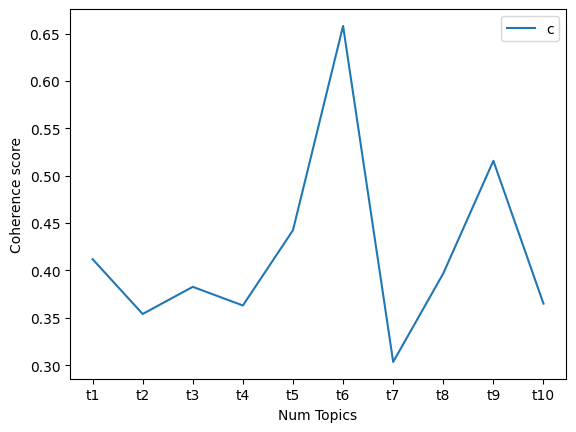

In [71]:
#Remove rare & common tokens
# Create a dictionary representation of the documents.
def sent_to_words(sentences):
    for sentence in sentences:
        # deacc=True removes punctuations
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

docs = list(sent_to_words(tmp_df['cleaned_text'].tolist()))


bigram = Phrases(docs, min_count=10)
trigram = Phrases(bigram[docs])

dictionary = Dictionary(docs)
dictionary.filter_extremes(no_below=10, no_above=0.2)


#Create dictionary and corpus required for Topic Modeling
corpus = [dictionary.doc2bow(doc) for doc in docs]
print('Number of unique tokens: %d' % len(dictionary))
print('Number of documents: %d' % len(corpus))
print(corpus[:1])


# Set parameters.
num_topics = 10
chunksize = 500
passes = 20
iterations = 400
eval_every = 1

# Make a index to word dictionary.
temp = dictionary[0]  # only to "load" the dictionary.
id2word = dictionary.id2token

lda_model = LdaModel(corpus=corpus, id2word=id2word, chunksize=chunksize, \
                       alpha='auto', eta='auto', \
                       iterations=iterations, num_topics=num_topics, \
                       passes=passes, eval_every=eval_every)

# Print the Keyword in the 10 topics
print(lda_model.print_topics())

# Compute Coherence Score using c_v
coherence_model_lda = CoherenceModel(model=lda_model, texts=docs, dictionary=dictionary, coherence='c_v')
coherence_ldas = coherence_model_lda.get_coherence_per_topic()
# print('\nCoherence Score: ', coherence_ldas)


topicsname=[]
for i in range(1,num_topics+1):
    topicsname.append("t{0}".format(i))
topicsname

plt.plot(topicsname,coherence_ldas)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()


la cohérence pour différents nombres de topics;   topics suggère que c'est le nombre de topics qui offre la meilleure interprétation sémantique pour ce jeu de données.

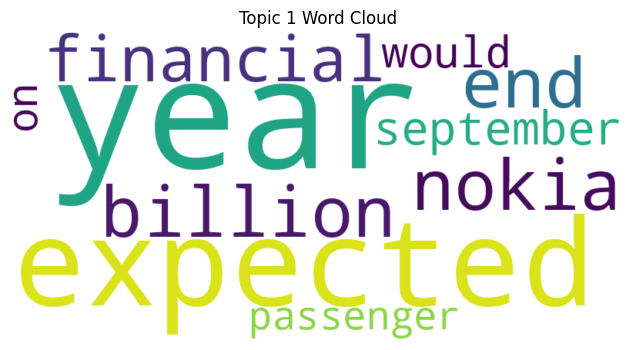

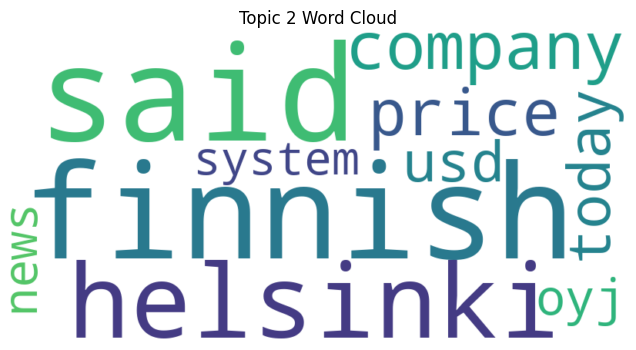

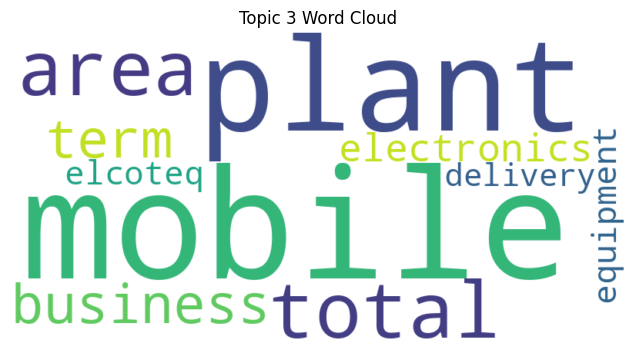

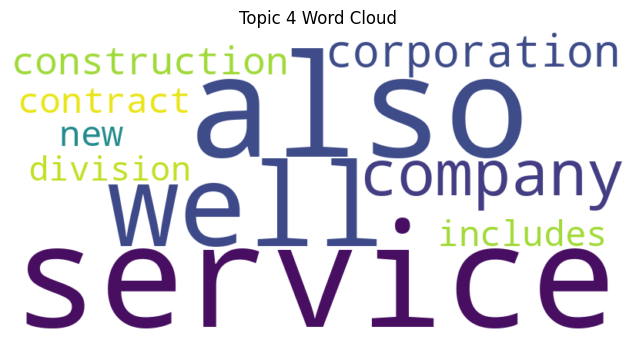

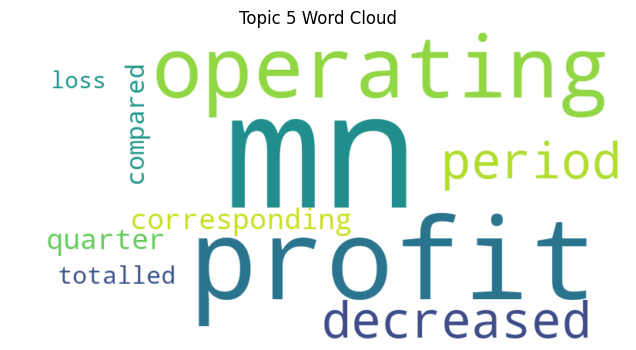

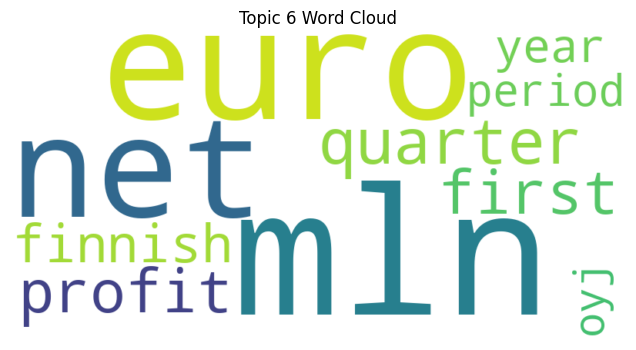

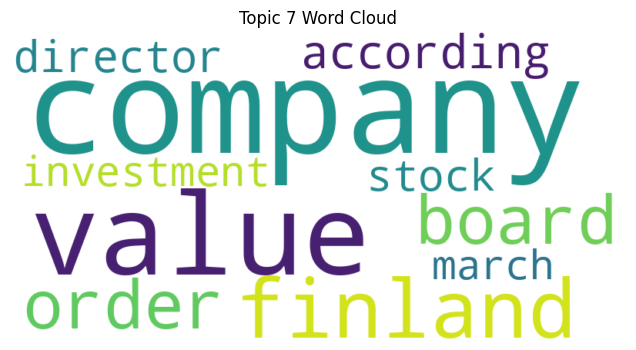

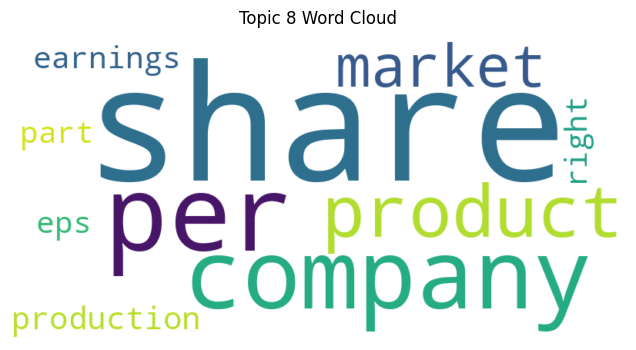

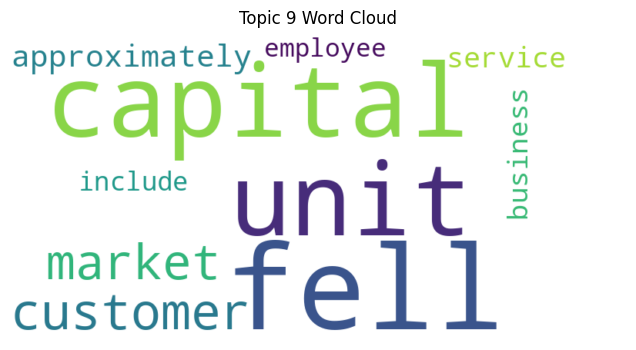

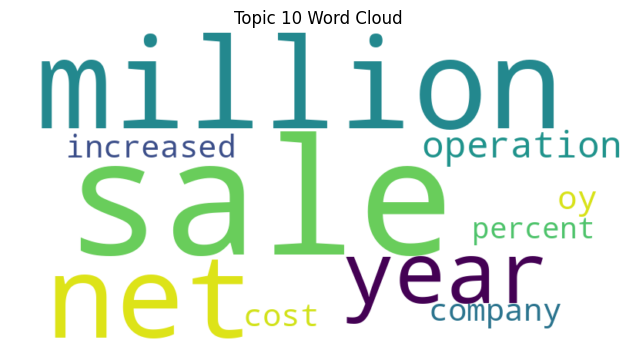

In [72]:
# Get the top words and their weights for each topic
topic_words = [lda_model.show_topic(topic_id, topn=10) for topic_id in range(num_topics)]

# Normalize the weights for each topic
normalized_weights = []
for topic in topic_words:
    total_weight = sum(weight for word, weight in topic)
    normalized_topic = [(word, weight / total_weight) for word, weight in topic]
    normalized_weights.append(normalized_topic)

# Create a word cloud for each topic
for topic_id, topic in enumerate(normalized_weights):
    wordcloud = WordCloud(width=800, height=400, background_color='white')
    wordcloud.generate_from_frequencies(dict(topic))

    # Plot the word cloud
    plt.figure(figsize=(8, 4))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f"Topic {topic_id + 1} Word Cloud")
    plt.axis('off')
    plt.show()


Les mots les plus présant suggére un théme lié aux finances.

**NMF**

In [73]:
from sklearn.decomposition import NMF

Topic 1: mn, eur mn, mn eur, profit, operating, operating profit, period, mn corresponding, corresponding period, corresponding
Topic 2: million, eur million, million eur, profit, percent, million million, million usd, ac, euro, million euro
Topic 3: share, capital, right, share capital, voting, voting right, number, market, earnings, earnings share
Topic 4: mln, euro, euro mln, mln euro, net profit, net, profit, mln eur, mln period, oyj
Topic 5: company, company said, said, according, investment, production, finnish, operation, board, approximately
Topic 6: sale, net sale, net, increase, sale eur, increased, expects net, expects, expected, growth
Topic 7: value, contract, order, total, value order, order eur, investment, project, mn, disclosed
Topic 8: year, year year, year eur, earlier, quarter, year earlier, percent, mn year, market, eur year
Topic 9: service, finland, business, group, product, market, customer, unit, operation, new
Topic 10: said, finnish, oyj, hel, today, said tod

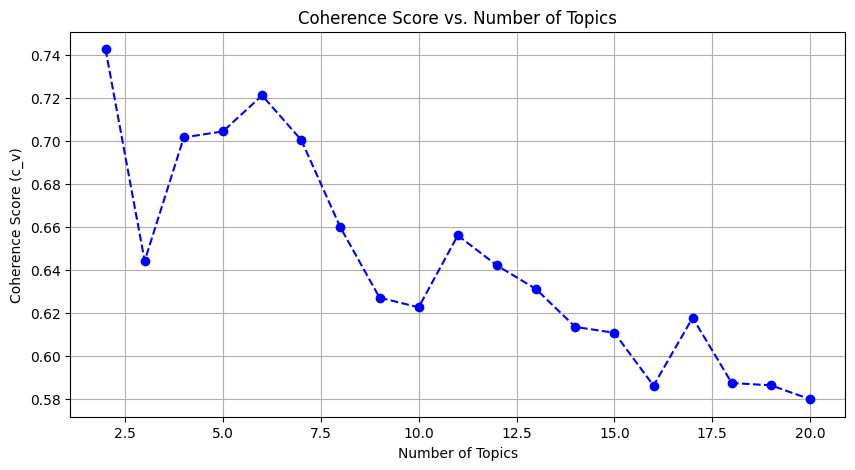

In [74]:

# Tokenize and preprocess your documents
def sent_to_words(sentences):
    for sentence in sentences:
        yield gensim.utils.simple_preprocess(str(sentence), deacc=True)

docs = list(sent_to_words(tmp_df['cleaned_text'].tolist()))

# Create TF-IDF vectors
tfidf_vectorizer = TfidfVectorizer(
    lowercase=True,
    stop_words='english',
    ngram_range=(1, 2),
    min_df=10,
    max_df=0.2
)

tfidf_matrix = tfidf_vectorizer.fit_transform(tmp_df['cleaned_text'])

# Fit NMF model
num_topics = 10  # Adjust the number of topics as needed
nmf_model = NMF(n_components=num_topics, random_state=42)
nmf_matrix = nmf_model.fit_transform(tfidf_matrix)

# Display the top words for each topic
feature_names = tfidf_vectorizer.get_feature_names_out()
top_words = []

for topic_idx, topic in enumerate(nmf_model.components_):
    top_words.append([feature_names[i] for i in topic.argsort()[:-11:-1]])

for i, words in enumerate(top_words):
    print(f"Topic {i+1}: {', '.join(words)}")

# Plot Coherence Scores
coherence_scores = []
for n in range(2, 21):  # You can adjust the range as needed
    nmf_model = NMF(n_components=n, random_state=42)
    nmf_matrix = nmf_model.fit_transform(tfidf_matrix)
    coherence_model_nmf = CoherenceModel(
        topics=[[feature_names[i] for i in topic.argsort()[:-11:-1]] for topic in nmf_model.components_],
        texts=docs,
        dictionary=Dictionary(docs),
        coherence='c_v'
    )
    coherence_scores.append(coherence_model_nmf.get_coherence())

# Plot the coherence scores
plt.figure(figsize=(10, 5))
plt.plot(range(2, 21), coherence_scores, marker='o', linestyle='--', color='b')
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score (c_v)")
plt.title("Coherence Score vs. Number of Topics")
plt.grid()
plt.show()



Le score de cohérence mesure la qualité des sujets identifiés.

Il y a une variation dans le score de cohérence à mesure que le nombre de topics augmente.

Le pic le plus élevé est observé pour un nombre de   topics , ce qui suggère que le modèle trouve des groupes de mots plus cohérents avec moins de topics.

Ce qui est vrai dans notre cas, comme en traite en majorité des sujets de finance.

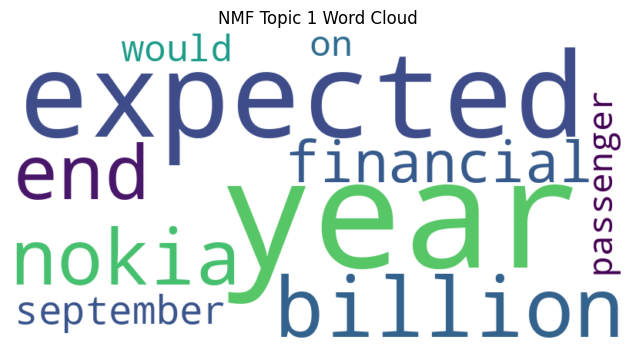

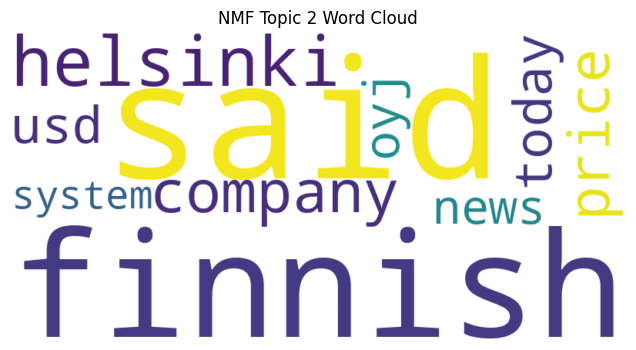

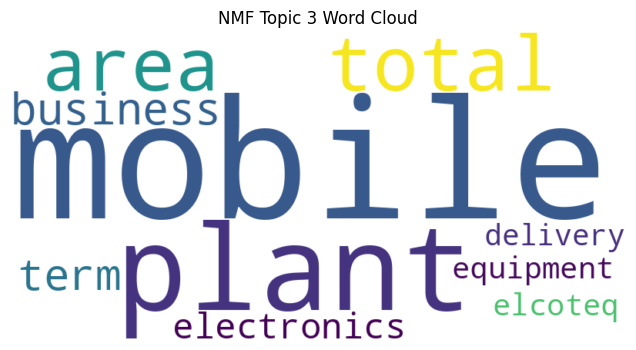

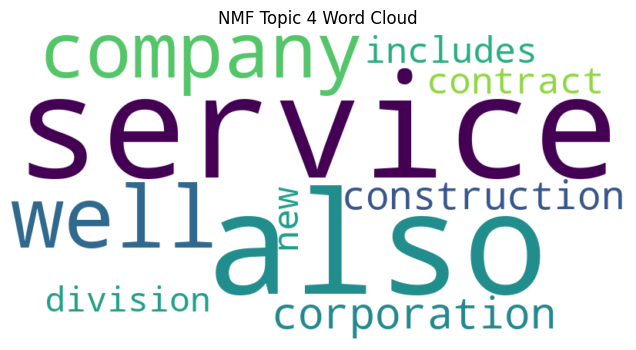

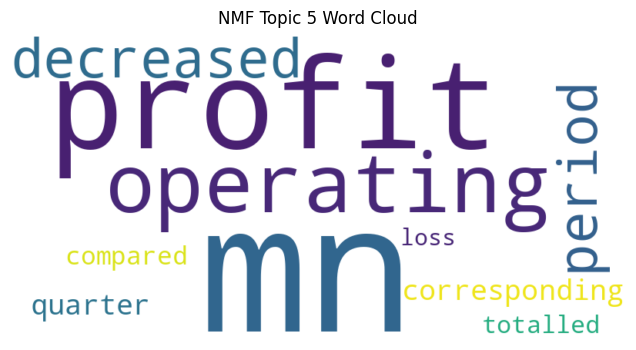

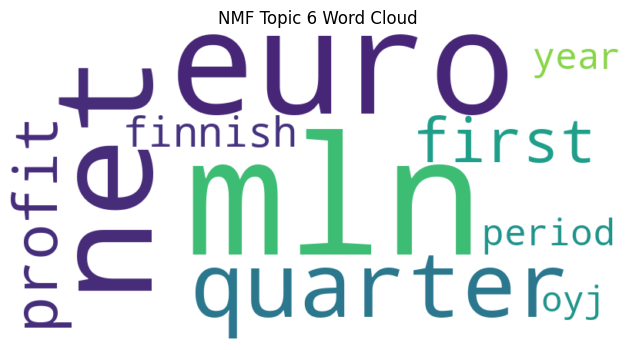

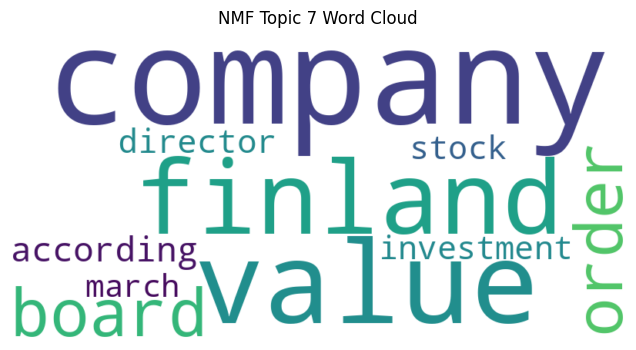

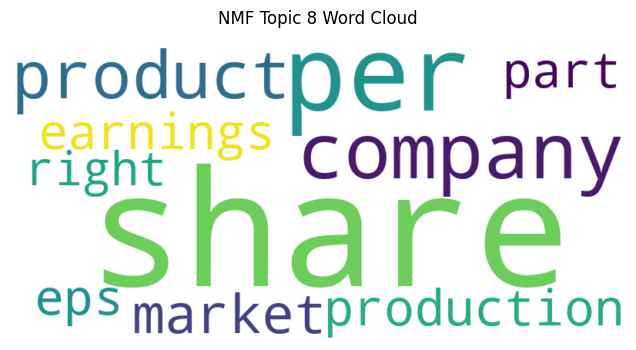

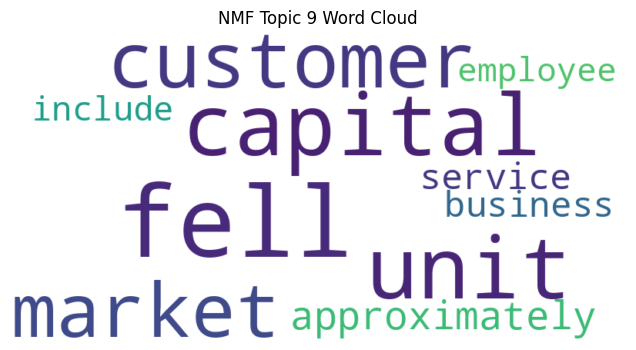

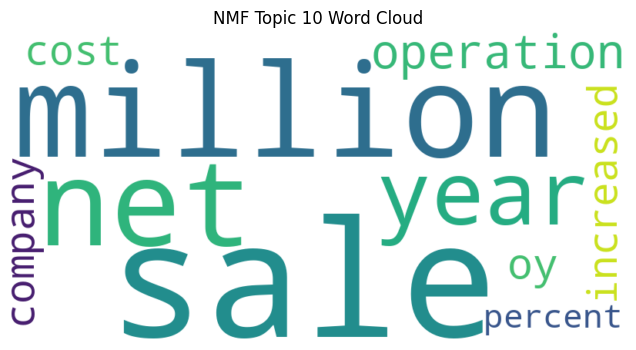

In [75]:
# Get the top 10 words and their weights for each topic
top_words = []
for topic in normalized_weights:
    top_words.append(sorted(topic, key=lambda x: x[1], reverse=True)[:10])

# Create a word cloud for each topic
for topic_id, topic in enumerate(top_words):
    wordcloud = WordCloud(width=800, height=400, background_color='white')
    wordcloud.generate_from_frequencies(dict(topic))

    # Plot the word cloud
    plt.figure(figsize=(8, 4))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f"NMF Topic {topic_id + 1} Word Cloud")
    plt.axis('off')
    plt.show()


Les mots tels que "euro", "capital", "year", et "billion" suggèrent que ce topic pourrait être associé aux rapports financiers, prévisions ou actualités économiques.
La présence de "Nokia" et "September" pourrait indiquer des événements ou des rapports spécifiques relatifs à cette entreprise ou période.

**BERTopic**

In [76]:
docs = dataset['train']['sentence']

In [77]:
# visualize document
docs[:1]

['according gran company plan move production russia although company growing ']

In [78]:
topic_model = BERTopic(embedding_model="bert-base-uncased", n_gram_range=(1, 2), min_topic_size=5)
topics, probs = topic_model.fit_transform(docs)

In [79]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,829,-1_sale_year_eur_million,"[sale, year, eur, million, company, said, net,...",[ adp news feb finnish construction company le...
1,0,74,0_paper_tonne_capacity_construction,"[paper, tonne, capacity, construction, design,...",[outotec s delivery cover engineering supply c...
2,1,54,1_said today_hel_oyj hel_oyj,"[said today, hel, oyj hel, oyj, today, finnish...",[ adp news feb finnish wood product technology...
3,2,47,2_inc_distribution unit_unit_distribution,"[inc, distribution unit, unit, distribution, g...",[company said currently french distribution un...
4,3,47,3_value_total_eur total_value contract,"[value, total, eur total, value contract, cont...","[value contract eur mn , total value contract ..."
...,...,...,...,...,...
82,81,6,81_year low_government higher_reached eight_fl...,"[year low, government higher, reached eight, f...",[ development partly reflect government s high...
83,82,6,82_mn compared_compared eur_mn previous_result...,"[mn compared, compared eur, mn previous, resul...",[operating profit totaled eur mn compared eur ...
84,83,5,83_eur mn_mn_mn eur_eur,"[eur mn, mn, mn eur, eur, mn first, state comp...",[finnish talentum report operating profit incr...
85,84,5,84_country russia_russia_baltic country_baltic,"[country russia, russia, baltic country, balti...",[kesko store engaged chain operation nordic ba...


In [80]:
topic_model.get_topic(0)

[('paper', 0.02103834404419469),
 ('tonne', 0.020977427937832197),
 ('capacity', 0.01815981385399165),
 ('construction', 0.017007064882081768),
 ('design', 0.015446881085223196),
 ('ton', 0.014776311096268837),
 ('building', 0.013894562345316623),
 ('well', 0.013220355289372956),
 ('industrial', 0.012711869697794155),
 ('energy', 0.012711869697794155)]

In [81]:
topic_model.get_topic(9)

[('mln', 0.13824755713031148),
 ('euro mln', 0.10803540800415636),
 ('mln euro', 0.10469842742820794),
 ('euro', 0.08364306614522059),
 ('mln first', 0.05290030640439579),
 ('mln period', 0.049967574660228865),
 ('net profit', 0.045606284805102384),
 ('oyj', 0.037552997371733),
 ('period finnish', 0.035545065348347345),
 ('oyj said', 0.035057125967570116)]

In [82]:
topic_model.visualize_topics()

In [83]:
topic_model.visualize_documents(docs)

In [84]:
topic_model.visualize_heatmap()

Le cluster ainsi que la matrice montrent la proximité(similarité) entres les topics.

Grande similutude :  


*   43 : corresponding, period, rose
*   9 : mn, operating, profit



# Conclusion

Durant ce projet on a travaillé sur un projet de Sentiment Analysis sur des données financiaires.

Nous avons travaillé sur differents aspects :

*   Exploration et visualisation des données
*   Traitement et vectorisation des données
*   Vectorisation avec TF-IDF, BOW et word2vec
*   Traitement du langage naturel  avec les modéle, de regression logistique, naiveBaies et SVC
*   Traitement du langage naturel avec les models transformers : Bert, Albert, Roberta et DistillBert
*   Traitement des topics

En conclusion, notre notebook témoigne de la puissance de l'apprentissage automatique et du traitement du langage naturel pour extraire des informations pertinentes à partir de données textuelles.
